In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from matplotlib.ticker import FormatStrFormatter

from src.utils.visualization import (
    animate_predictions
)

In [9]:
clstm_results_real = np.load('results/predictions/clstm/sparse_real_random_predictions.npz')
clstm_results_real_1 = np.load('results/predictions/clstm/sparse_real_random_t1_predictions.npz')
clstm_results_real_perlin = np.load('results/predictions/clstm/sparse_real_random_perlin_predictions.npz')

vitae_results_real = np.load("results/predictions/vitae/sparse_real_random_predictions.npz")

vunet_results_real = np.load('results/predictions/vunet/sparse_real_random_predictions.npz')
vunet_results_real_1 = np.load('results/predictions/vunet/sparse_real_random_t1_predictions.npz')
vunet_results_real_gaussian = np.load('results/predictions/vunet/sparse_real_random_gaussian_predictions.npz')
vunet_results_real_perlin = np.load('results/predictions/vunet/sparse_real_random_perlin_predictions.npz')
vunet_results_real_gaussian_full = np.load('results/predictions/vunet/sparse_real_random_gaussian_full_predictions.npz')

kriging_results_real = np.load('results/predictions/kriging/real_random_predictions.npz')

/tmp/ipykernel_3837572/3278448854.py:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')


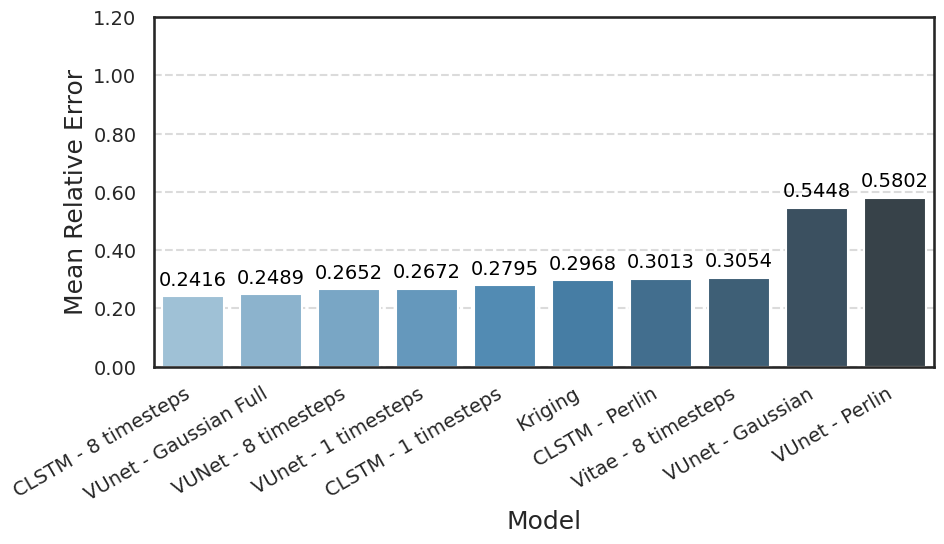

In [10]:
sns.set_theme(style="white", context="talk", font_scale=1.4)

# Create DataFrame
models_data = {
    "Model": [
        "VUNet - 8 timesteps", 
        "VUnet - 1 timesteps", 
        "VUnet - Gaussian", 
        "VUnet - Perlin", 
        "VUnet - Gaussian Full",

        "Kriging", 

        "CLSTM - 8 timesteps", 
        "CLSTM - 1 timesteps", 
        "CLSTM - Perlin", 

        "Vitae - 8 timesteps"],
    "MeanRelativeError": [
        np.mean(vunet_results_real['errors']),
        np.mean(vunet_results_real_1['errors']),
        np.mean(vunet_results_real_gaussian['errors']),
        np.mean(vunet_results_real_perlin['errors']),
        np.mean(vunet_results_real_gaussian_full['errors']),

        np.mean(kriging_results_real['errors']),

        np.mean(clstm_results_real['errors']),
        np.mean(clstm_results_real_1['errors']),
        np.mean(clstm_results_real_perlin['errors']),

        np.mean(vitae_results_real['errors']),
    ]
}
df = pd.DataFrame(models_data)
df = df.sort_values(by="MeanRelativeError", ascending=True)

# Plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=df, x="Model", y="MeanRelativeError", hue="Model", palette="Blues_d")

# Add value labels
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4f}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', fontsize=14, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Axis formatting
ax.set_xlabel("Model", fontsize=18)
ax.set_ylabel("Mean Relative Error", fontsize=18)
ax.tick_params(axis='x', labelsize=14)
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.tick_params(axis='y', labelsize=14)
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1.2)

# Tilt x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

plt.tight_layout()
plt.savefig("report_images/experiments/real/errors_bar.png", dpi=300, bbox_inches='tight')
plt.show()

In [13]:
animate_predictions(
    predictions=vunet_results_real_gaussian['predictions'],
    num_frames=50
)

In [14]:
animate_predictions(
    predictions=vunet_results_real_gaussian_full['predictions'],
    num_frames=50
)